EVALUASI METODE RESTORASI CITRA
Foto 'img3.jpeg' berhasil di-load.


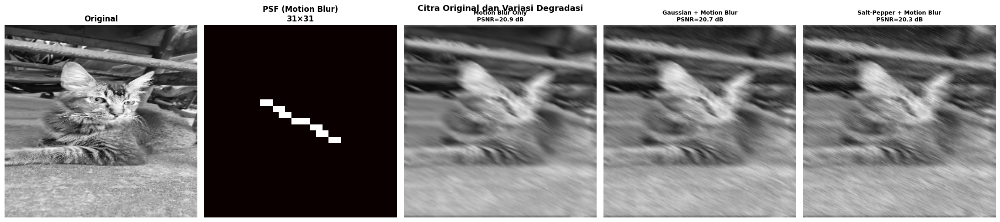


SKENARIO: Motion Blur Only

  Metode                      MSE   PSNR(dB)     SSIM   Time(ms)
  --------------------------------------------------------------
  [Degraded]               522.50      20.95   0.5075          —
  Inverse Filter          5529.33      10.70   0.0357    25.9521
  Wiener K=0.001          4804.94      11.31   0.0934     6.9913
  Wiener K=0.01           4581.04      11.52   0.1097     7.7305
  Wiener K=0.05           4317.54      11.78   0.1278     7.5783
  Wiener K=0.1            4206.14      11.89   0.1370     6.9212
  Lucy-Richardson          249.99      24.15   0.7300  6996.3779

  → Filter terbaik (PSNR): Lucy-Richardson (24.15 dB)


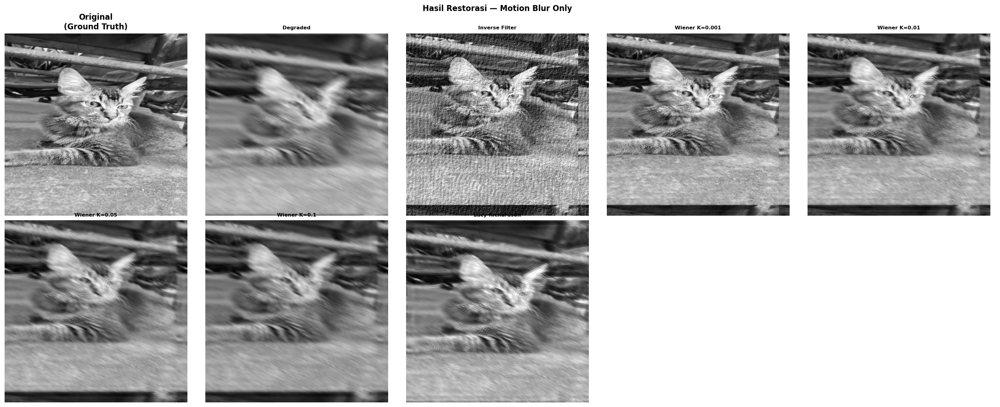

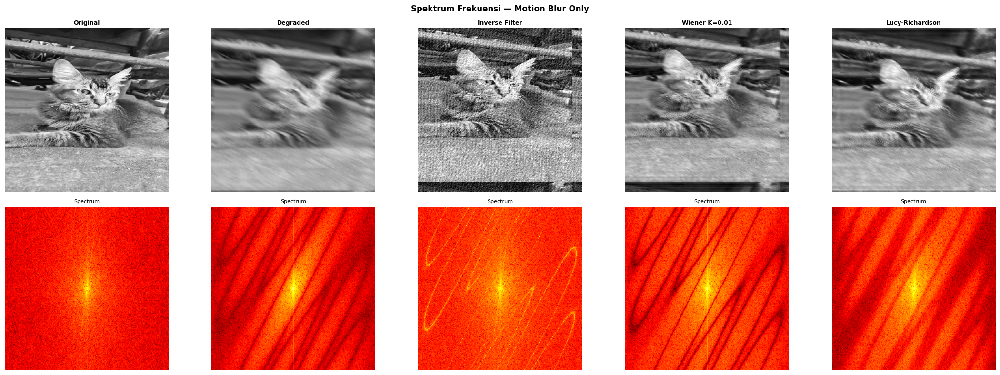


SKENARIO: Gaussian + Motion Blur

  Metode                      MSE   PSNR(dB)     SSIM   Time(ms)
  --------------------------------------------------------------
  [Degraded]               550.98      20.72   0.4710          —
  Inverse Filter          5715.59      10.56   0.0269    18.5322
  Wiener K=0.001          5047.82      11.10   0.0518    12.4678
  Wiener K=0.01           4698.07      11.41   0.0728     7.4958
  Wiener K=0.05           4365.04      11.73   0.1006     8.0405
  Wiener K=0.1            4236.16      11.86   0.1160     7.5715
  Lucy-Richardson          353.16      22.65   0.5987  7509.0722

  → Filter terbaik (PSNR): Lucy-Richardson (22.65 dB)


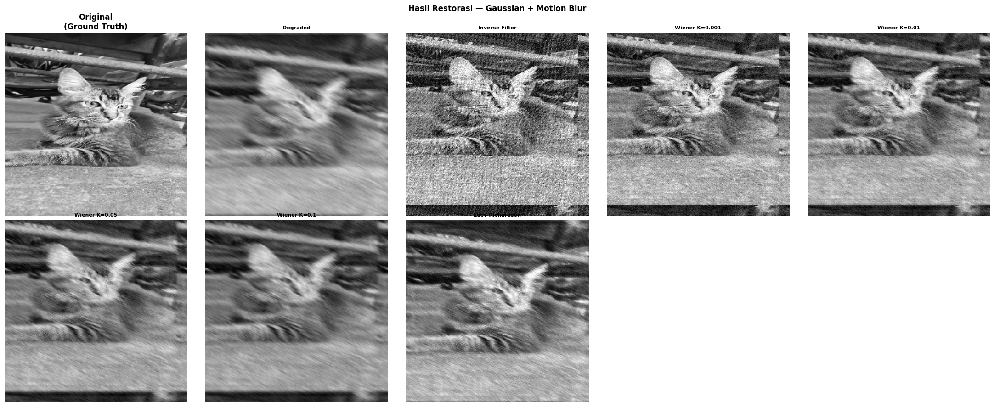

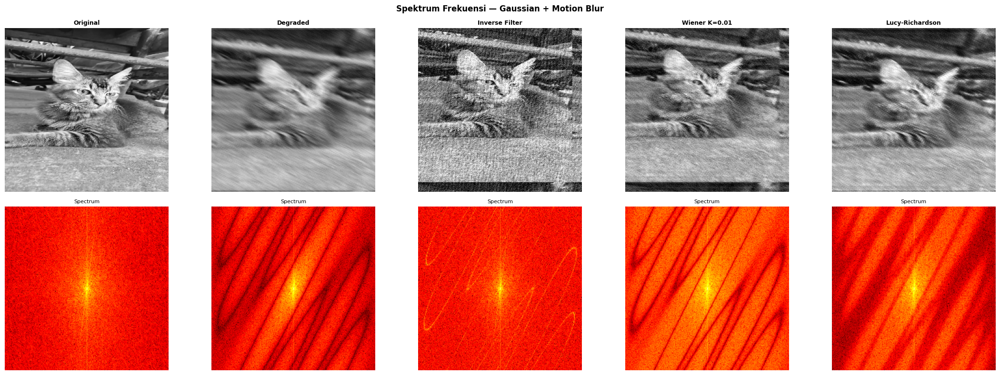


SKENARIO: Salt-Pepper + Motion Blur

  Metode                      MSE   PSNR(dB)     SSIM   Time(ms)
  --------------------------------------------------------------
  [Degraded]               606.32      20.30   0.4306          —
  Inverse Filter          5972.38      10.37   0.0260    17.4831
  Wiener K=0.001          5262.99      10.92   0.0456     7.7999
  Wiener K=0.01           4737.46      11.38   0.0622     7.5645
  Wiener K=0.05           4316.29      11.78   0.0888     7.4764
  Wiener K=0.1            4171.60      11.93   0.1053     7.8164
  Lucy-Richardson          517.99      20.99   0.5065  9807.4053

  → Filter terbaik (PSNR): Lucy-Richardson (20.99 dB)


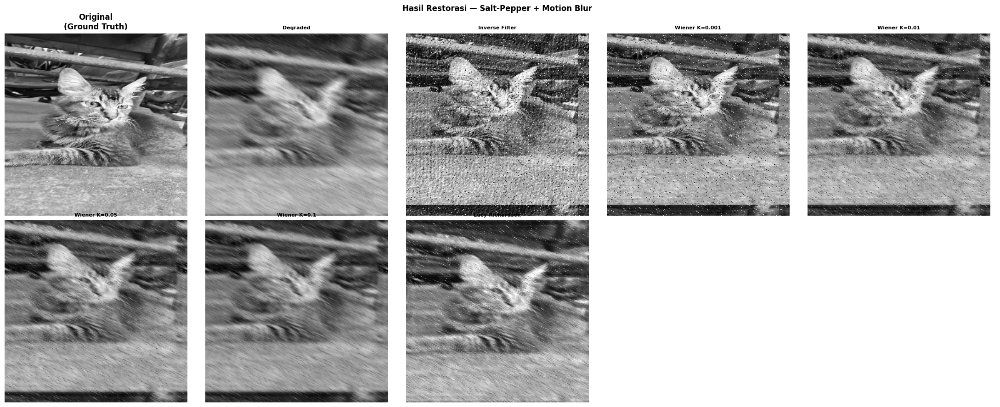

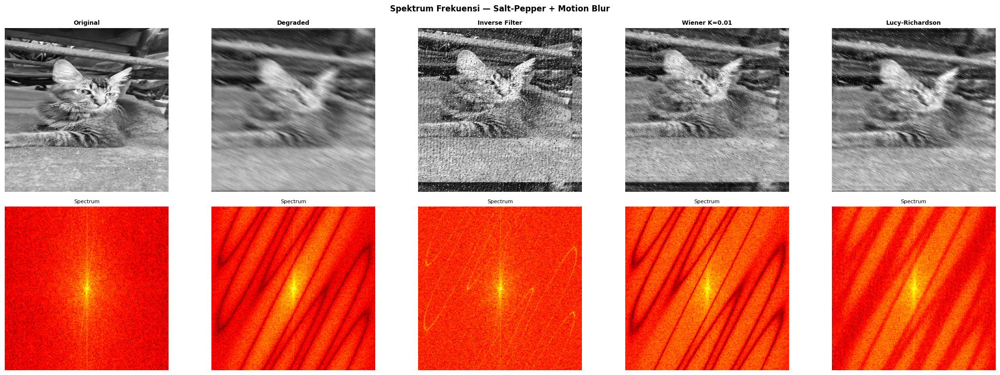


ANALISIS AKURASI ESTIMASI PSF

  PSF Estimasi                      MSE   PSNR(dB)     SSIM
  ----------------------------------------------------------
  PSF L=5  (under)              1914.37      15.31   0.1461
  PSF L=10 (under)              3446.16      12.76   0.1244
  PSF L=15 (benar)              4581.04      11.52   0.1097
  PSF L=20 (over)               5797.45      10.50   0.0721
  PSF angle=45 (salah arah)     5167.81      11.00   0.1162


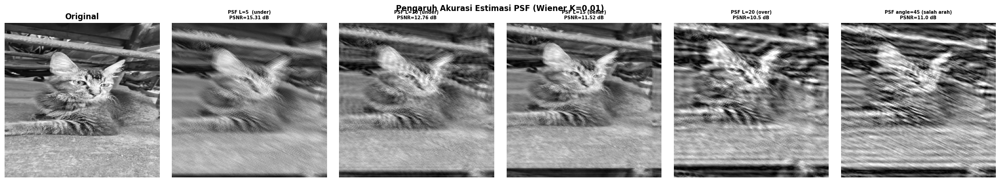

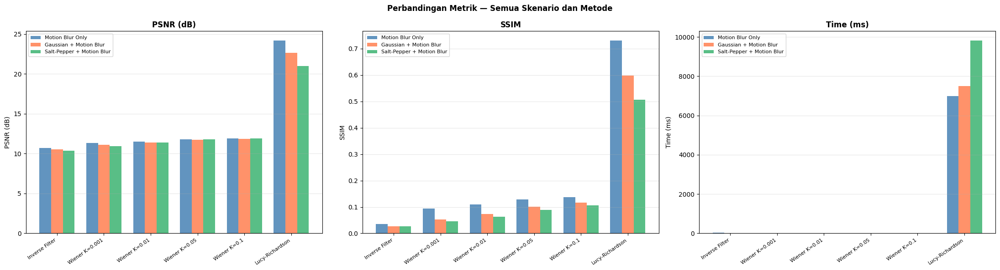


RINGKASAN: FILTER TERBAIK PER SKENARIO

  Skenario                       Filter Terbaik             PSNR     SSIM
  ------------------------------------------------------------------------
  Motion Blur Only               Lucy-Richardson           24.15   0.7300
  Gaussian + Motion Blur         Lucy-Richardson           22.65   0.5987
  Salt-Pepper + Motion Blur      Lucy-Richardson           20.99   0.5065

Rekomendasi Pipeline:
  Motion Blur saja        → Wiener K=0.001 (PSF akurat, noise rendah)
  + Gaussian Noise        → Wiener K=0.01–0.05 (K disesuaikan level noise)
  + Salt-and-Pepper       → Median filter dulu → Wiener (hybrid pipeline)
  PSF tidak diketahui     → Lucy-Richardson (lebih robust, tanpa PSF eksak)

Trade-off:
  Inverse Filter   → Kualitas tinggi jika PSF akurat, tidak stabil jika noise
  Wiener Filter    → Stabil, K harus disesuaikan manual per kondisi
  Lucy-Richardson  → Paling robust, tapi paling lambat (iteratif)
    

SELESAI


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import time
import warnings
warnings.filterwarnings('ignore')


# ============================================================
# BAGIAN 1: PERSIAPAN CITRA DAN DEGRADASI
# ============================================================

def load_or_create_image(image_path=None, size=256):
    """Load foto asli atau buat citra sintetik."""
    if image_path:
        img = cv2.imread(image_path)
        if img is not None:
            img = cv2.resize(img, (size, size))
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            print(f"Foto '{image_path}' berhasil di-load.")
            return gray
        print("File tidak ditemukan, menggunakan citra sintetik.")

    img = np.zeros((size, size), dtype=np.float32)
    cv2.rectangle(img, (30,  30),  (110, 110), 200, -1)
    cv2.circle(img,    (190, 70),   50,         180, -1)
    cv2.ellipse(img,   (128, 195),  (70, 35),   0, 0, 360, 150, -1)
    cv2.line(img,      (10,  200),  (246, 200), 220, 2)
    cv2.line(img,      (128, 10),   (128, 246), 220, 2)

    y, x = np.mgrid[0:size, 0:size]
    img += 20 * np.sin(2 * np.pi * x / 40) * np.sin(2 * np.pi * y / 40)
    img += np.random.normal(0, 5, img.shape)
    return np.clip(img, 0, 255).astype(np.uint8)


# ── PSF ──────────────────────────────────────────────────────

def create_motion_blur_psf(length=15, angle=30, size=None):
    """
    Buat PSF motion blur dengan panjang dan sudut tertentu.
    Hasilnya ternormalisasi agar jumlah elemen = 1.
    """
    if size is None:
        size = length * 2 + 1
    psf = np.zeros((size, size), dtype=np.float32)
    cx  = size // 2
    cy  = size // 2
    rad = np.deg2rad(angle)
    for i in range(-(length//2), length//2 + 1):
        x = cx + int(round(i * np.cos(rad)))
        y = cy + int(round(i * np.sin(rad)))
        if 0 <= x < size and 0 <= y < size:
            psf[y, x] = 1
    s = psf.sum()
    if s > 0:
        psf /= s
    return psf


# ── Degradasi ────────────────────────────────────────────────

def apply_motion_blur(image, psf):
    """Konvolusi citra dengan PSF."""
    blurred = convolve2d(image.astype(np.float32), psf, mode='same', boundary='wrap')
    return np.clip(blurred, 0, 255).astype(np.uint8)


def add_gaussian_noise(image, std=20):
    noisy = image.astype(np.float32) + np.random.normal(0, std, image.shape)
    return np.clip(noisy, 0, 255).astype(np.uint8)


def add_salt_pepper_noise(image, prob=0.05):
    noisy = image.copy()
    n     = image.size
    n_s   = int(n * prob / 2)
    n_p   = int(n * prob / 2)
    for _ in range(n_s):
        r, c = np.random.randint(0, image.shape[0]), np.random.randint(0, image.shape[1])
        noisy[r, c] = 255
    for _ in range(n_p):
        r, c = np.random.randint(0, image.shape[0]), np.random.randint(0, image.shape[1])
        noisy[r, c] = 0
    return noisy


def create_degraded_images(clean, psf):
    """Buat 3 variasi degradasi dari satu citra bersih."""
    deg1 = apply_motion_blur(clean, psf)

    noisy = add_gaussian_noise(clean, std=20)
    deg2  = apply_motion_blur(noisy, psf)

    noisy_sp = add_salt_pepper_noise(clean, prob=0.05)
    deg3     = apply_motion_blur(noisy_sp, psf)

    return {
        'Motion Blur Only'          : deg1,
        'Gaussian + Motion Blur'    : deg2,
        'Salt-Pepper + Motion Blur' : deg3,
    }


def show_degraded(clean, degraded, psf):
    fig, axes = plt.subplots(1, len(degraded) + 2, figsize=(22, 5))
    axes[0].imshow(clean, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original', fontweight='bold'); axes[0].axis('off')

    psf_vis = (psf / psf.max() * 255).astype(np.uint8)
    axes[1].imshow(psf_vis, cmap='hot')
    axes[1].set_title(f'PSF (Motion Blur)\n{psf.shape[0]}×{psf.shape[1]}',
                      fontweight='bold'); axes[1].axis('off')

    for ax, (name, img) in zip(axes[2:], degraded.items()):
        mse  = np.mean((clean.astype(float) - img.astype(float))**2)
        psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
        ax.imshow(img, cmap='gray', vmin=0, vmax=255)
        ax.set_title(f'{name}\nPSNR={psnr:.1f} dB', fontweight='bold', fontsize=9)
        ax.axis('off')

    plt.suptitle('Citra Original dan Variasi Degradasi', fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()


# ============================================================
# BAGIAN 2: METRIK EVALUASI
# ============================================================

def compute_ssim(img1, img2):
    C1 = (0.01 * 255) ** 2
    C2 = (0.03 * 255) ** 2
    i1 = img1.astype(np.float64)
    i2 = img2.astype(np.float64)
    mu1 = cv2.GaussianBlur(i1, (11, 11), 1.5)
    mu2 = cv2.GaussianBlur(i2, (11, 11), 1.5)
    mu1_sq  = mu1 ** 2; mu2_sq  = mu2 ** 2; mu1_mu2 = mu1 * mu2
    s1  = cv2.GaussianBlur(i1 * i1, (11, 11), 1.5) - mu1_sq
    s2  = cv2.GaussianBlur(i2 * i2, (11, 11), 1.5) - mu2_sq
    s12 = cv2.GaussianBlur(i1 * i2, (11, 11), 1.5) - mu1_mu2
    num = (2 * mu1_mu2 + C1) * (2 * s12 + C2)
    den = (mu1_sq + mu2_sq + C1) * (s1 + s2 + C2)
    return float(np.mean(num / den))


def compute_metrics(clean, restored):
    h, w = clean.shape
    r    = restored[:h, :w]
    mse  = float(np.mean((clean.astype(float) - r.astype(float)) ** 2))
    psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
    ssim = compute_ssim(clean, r)
    return round(mse, 2), round(psnr, 2), round(ssim, 4)


# ============================================================
# BAGIAN 3: METODE RESTORASI
# ============================================================

def inverse_filter(degraded, psf, epsilon=1e-3):
    """
    Inverse filtering di domain frekuensi.
    G(u,v) / H(u,v) — dibatasi dengan epsilon untuk stabilitas.
    epsilon mencegah pembagian dengan nilai H yang sangat kecil
    yang akan mengamplifikasi noise secara ekstrem.
    """
    size_h, size_w = degraded.shape
    psf_pad = np.zeros_like(degraded, dtype=np.float32)
    ph, pw  = psf.shape
    psf_pad[:ph, :pw] = psf

    G = np.fft.fft2(degraded.astype(np.float32))
    H = np.fft.fft2(psf_pad)

    H_abs  = np.abs(H)
    H_safe = np.where(H_abs > epsilon, H, epsilon * np.exp(1j * np.angle(H)))
    F_est  = G / H_safe

    restored = np.abs(np.fft.ifft2(F_est))
    return np.clip(restored, 0, 255).astype(np.uint8)


def wiener_filter(degraded, psf, K=0.01):
    """
    Wiener filter di domain frekuensi.
    H*(u,v) / (|H(u,v)|^2 + K) * G(u,v)
    K adalah rasio noise-to-signal power — semakin besar K
    semakin agresif regularisasinya (lebih smooth, kurang sharp).
    """
    size_h, size_w = degraded.shape
    psf_pad = np.zeros_like(degraded, dtype=np.float32)
    ph, pw  = psf.shape
    psf_pad[:ph, :pw] = psf

    G = np.fft.fft2(degraded.astype(np.float32))
    H = np.fft.fft2(psf_pad)

    H_conj = np.conj(H)
    H_sq   = np.abs(H) ** 2
    W      = H_conj / (H_sq + K)
    F_est  = W * G

    restored = np.abs(np.fft.ifft2(F_est))
    return np.clip(restored, 0, 255).astype(np.uint8)


def lucy_richardson(degraded, psf, iterations=20):
    """
    Lucy-Richardson deconvolution (iteratif, berbasis Bayes).
    Estimasi diperbarui iteratif menggunakan:
    f_n+1 = f_n * (h_flipped * (g / (h * f_n)))
    Lebih robust terhadap noise dibanding inverse filter.
    """
    psf_f   = np.flip(psf)
    f       = degraded.astype(np.float64) / 255.0
    g       = degraded.astype(np.float64) / 255.0

    for _ in range(iterations):
        hf      = convolve2d(f, psf, mode='same', boundary='wrap')
        hf      = np.where(hf == 0, 1e-10, hf)
        ratio   = g / hf
        f       = f * convolve2d(ratio, psf_f, mode='same', boundary='wrap')
        f       = np.clip(f, 0, 1)

    return np.clip(f * 255, 0, 255).astype(np.uint8)


def wiener_filter_variants(degraded, psf, k_values):
    """Jalankan Wiener filter dengan beberapa nilai K."""
    results = {}
    for k in k_values:
        results[f'Wiener K={k}'] = wiener_filter(degraded, psf, K=k)
    return results


# ============================================================
# BAGIAN 4: EVALUASI PER SKENARIO
# ============================================================

def evaluate_scenario(clean, degraded, psf, scenario_name):
    """Terapkan semua metode restorasi dan evaluasi."""
    print(f"\n{'='*70}")
    print(f"SKENARIO: {scenario_name}")
    print(f"{'='*70}")

    k_values = [0.001, 0.01, 0.05, 0.1]
    methods  = {}

    # Inverse filter
    t0 = time.perf_counter()
    methods['Inverse Filter'] = inverse_filter(degraded, psf, epsilon=1e-3)
    t_inv = (time.perf_counter() - t0) * 1000

    # Wiener filter (berbagai K)
    t_wiener = {}
    for k in k_values:
        t0 = time.perf_counter()
        methods[f'Wiener K={k}'] = wiener_filter(degraded, psf, K=k)
        t_wiener[k] = (time.perf_counter() - t0) * 1000

    # Lucy-Richardson
    t0 = time.perf_counter()
    methods['Lucy-Richardson'] = lucy_richardson(degraded, psf, iterations=20)
    t_lr = (time.perf_counter() - t0) * 1000

    # Tabel metrik
    print(f"\n  {'Metode':<22} {'MSE':>8} {'PSNR(dB)':>10} {'SSIM':>8} {'Time(ms)':>10}")
    print(f"  {'-'*62}")

    # Degraded sebagai baseline
    mse_d, psnr_d, ssim_d = compute_metrics(clean, degraded)
    print(f"  {'[Degraded]':<22} {mse_d:>8.2f} {psnr_d:>10.2f} {ssim_d:>8.4f} {'—':>10}")

    times = {'Inverse Filter': t_inv, 'Lucy-Richardson': t_lr}
    for k in k_values:
        times[f'Wiener K={k}'] = t_wiener[k]

    all_metrics = {}
    for name, img in methods.items():
        mse, psnr, ssim = compute_metrics(clean, img)
        t = times.get(name, 0)
        all_metrics[name] = {'mse': mse, 'psnr': psnr, 'ssim': ssim, 'time': t}
        print(f"  {name:<22} {mse:>8.2f} {psnr:>10.2f} {ssim:>8.4f} {t:>10.4f}")

    best = max(all_metrics, key=lambda k: all_metrics[k]['psnr'])
    print(f"\n  → Filter terbaik (PSNR): {best} "
          f"({all_metrics[best]['psnr']} dB)")

    return methods, all_metrics


def visualize_results(clean, degraded, methods, scenario_name):
    """Visualisasi semua hasil restorasi untuk satu skenario."""
    all_imgs = {'Degraded': degraded, **methods}
    n        = len(all_imgs) + 1
    cols     = 5
    rows     = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(22, rows * 4.5))
    axes      = axes.ravel()

    axes[0].imshow(clean, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original\n(Ground Truth)', fontweight='bold')
    axes[0].axis('off')

    for idx, (name, img) in enumerate(all_imgs.items(), 1):
        axes[idx].imshow(img, cmap='gray', vmin=0, vmax=255)
        axes[idx].set_title(name, fontsize=8, fontweight='bold')
        axes[idx].axis('off')

    for idx in range(len(all_imgs) + 1, len(axes)):
        axes[idx].axis('off')

    plt.suptitle(f'Hasil Restorasi — {scenario_name}',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


def visualize_frequency_spectrum(clean, degraded, restored_dict, scenario_name):
    """Visualisasi spektrum frekuensi original, degraded, dan restored."""
    def mag_spectrum(img):
        f   = np.fft.fft2(img.astype(np.float32))
        fs  = np.fft.fftshift(f)
        return np.log1p(np.abs(fs))

    select = ['Inverse Filter', 'Wiener K=0.01', 'Lucy-Richardson']
    items  = [('Original', clean), ('Degraded', degraded)] + \
             [(k, restored_dict[k]) for k in select if k in restored_dict]

    fig, axes = plt.subplots(2, len(items), figsize=(22, 8))
    for col, (name, img) in enumerate(items):
        axes[0, col].imshow(img, cmap='gray', vmin=0, vmax=255)
        axes[0, col].set_title(name, fontweight='bold', fontsize=9)
        axes[0, col].axis('off')
        axes[1, col].imshow(mag_spectrum(img), cmap='hot')
        axes[1, col].set_title('Spectrum', fontsize=8)
        axes[1, col].axis('off')

    plt.suptitle(f'Spektrum Frekuensi — {scenario_name}',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


def visualize_metrics_comparison(all_scenario_metrics):
    """Bar chart perbandingan PSNR semua skenario dan metode."""
    scenarios = list(all_scenario_metrics.keys())
    methods   = list(list(all_scenario_metrics.values())[0].keys())
    x         = np.arange(len(methods))
    width     = 0.25
    colors    = ['steelblue', 'coral', 'mediumseagreen']

    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    for ax, metric, ylabel in zip(
        axes,
        ['psnr', 'ssim', 'time'],
        ['PSNR (dB)', 'SSIM', 'Time (ms)']
    ):
        for i, (scenario, color) in enumerate(zip(scenarios, colors)):
            vals = [all_scenario_metrics[scenario][m][metric] for m in methods]
            bars = ax.bar(x + i * width, vals, width, label=scenario,
                          color=color, alpha=0.85)

        ax.set_xticks(x + width)
        ax.set_xticklabels(methods, rotation=35, ha='right', fontsize=8)
        ax.set_title(ylabel, fontweight='bold')
        ax.set_ylabel(ylabel)
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3, axis='y')

    plt.suptitle('Perbandingan Metrik — Semua Skenario dan Metode',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


def psf_accuracy_analysis(clean, degraded_blur, psf_true):
    """
    Analisis pengaruh akurasi estimasi PSF terhadap hasil.
    Gunakan PSF dengan panjang berbeda sebagai estimasi yang salah.
    """
    print("\n" + "="*70)
    print("ANALISIS AKURASI ESTIMASI PSF")
    print("="*70)

    psf_variants = {
        'PSF L=5  (under)' : create_motion_blur_psf(length=5,  angle=30),
        'PSF L=10 (under)' : create_motion_blur_psf(length=10, angle=30),
        'PSF L=15 (benar)' : psf_true,
        'PSF L=20 (over)'  : create_motion_blur_psf(length=20, angle=30),
        'PSF angle=45 (salah arah)': create_motion_blur_psf(length=15, angle=45),
    }

    print(f"\n  {'PSF Estimasi':<28} {'MSE':>8} {'PSNR(dB)':>10} {'SSIM':>8}")
    print(f"  {'-'*58}")

    fig, axes = plt.subplots(1, len(psf_variants) + 1, figsize=(22, 4))
    axes[0].imshow(clean, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original', fontweight='bold'); axes[0].axis('off')

    for col, (name, psf_est) in enumerate(psf_variants.items(), 1):
        restored = wiener_filter(degraded_blur, psf_est, K=0.01)
        mse, psnr, ssim = compute_metrics(clean, restored)
        print(f"  {name:<28} {mse:>8.2f} {psnr:>10.2f} {ssim:>8.4f}")
        axes[col].imshow(restored, cmap='gray', vmin=0, vmax=255)
        axes[col].set_title(f'{name}\nPSNR={psnr} dB', fontsize=7, fontweight='bold')
        axes[col].axis('off')

    plt.suptitle('Pengaruh Akurasi Estimasi PSF (Wiener K=0.01)',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


# ============================================================
# BAGIAN 5: RINGKASAN FINAL
# ============================================================

def final_summary(all_scenario_metrics):
    print("\n" + "="*70)
    print("RINGKASAN: FILTER TERBAIK PER SKENARIO")
    print("="*70)

    print(f"\n  {'Skenario':<30} {'Filter Terbaik':<22} {'PSNR':>8} {'SSIM':>8}")
    print(f"  {'-'*72}")

    for scenario, metrics in all_scenario_metrics.items():
        best = max(metrics, key=lambda k: metrics[k]['psnr'])
        m    = metrics[best]
        print(f"  {scenario:<30} {best:<22} {m['psnr']:>8.2f} {m['ssim']:>8.4f}")

    print(f"""
Rekomendasi Pipeline:
  Motion Blur saja        → Wiener K=0.001 (PSF akurat, noise rendah)
  + Gaussian Noise        → Wiener K=0.01–0.05 (K disesuaikan level noise)
  + Salt-and-Pepper       → Median filter dulu → Wiener (hybrid pipeline)
  PSF tidak diketahui     → Lucy-Richardson (lebih robust, tanpa PSF eksak)

Trade-off:
  Inverse Filter   → Kualitas tinggi jika PSF akurat, tidak stabil jika noise
  Wiener Filter    → Stabil, K harus disesuaikan manual per kondisi
  Lucy-Richardson  → Paling robust, tapi paling lambat (iteratif)
    """)


# ============================================================
# MAIN
# ============================================================

print("="*70)
print("EVALUASI METODE RESTORASI CITRA")
print("="*70)

np.random.seed(42)

# Ganti 'foto.jpg' dengan nama foto kamu
IMAGE_PATH = 'img3.jpeg'

clean  = load_or_create_image(IMAGE_PATH, size=256)
psf    = create_motion_blur_psf(length=15, angle=30)
degraded_dict = create_degraded_images(clean, psf)

show_degraded(clean, degraded_dict, psf)

# Evaluasi semua skenario
all_scenario_metrics = {}

for scenario_name, degraded in degraded_dict.items():
    methods, metrics = evaluate_scenario(clean, degraded, psf, scenario_name)
    all_scenario_metrics[scenario_name] = metrics
    visualize_results(clean, degraded, methods, scenario_name)
    visualize_frequency_spectrum(clean, degraded, methods, scenario_name)

# Analisis PSF
psf_accuracy_analysis(clean, degraded_dict['Motion Blur Only'], psf)

# Perbandingan metrik semua skenario
visualize_metrics_comparison(all_scenario_metrics)

# Ringkasan
final_summary(all_scenario_metrics)

print("\n" + "="*70)
print("SELESAI")
print("="*70)